<html>
 <head>
 </head>
 <body>
                    <div class="alert alert-block alert-info" style="color:darkgreen;font-size:20px;text-align:center">
         <b>Radiometric Terrain Flattening (RTF) and Locally Weighted Regression (LWR) for Sentinel-1 </b>
     </div>
     <p style="text-align:center"> Python 3.6 and SNAP 8 (updated in Sept. 2022) </p>
     <br/>
     <a id='content'></a>
     <p style="color:blue"> <b>Contents:</b> </p>
       <a href="#1.">1. Setting and user-defined functions</a><br />
      <a href="#2.">2. Pre-processing: orbit file, thermal noise removal, speckle filter</a><br />
     <a href="#3.">3. Radiometric Terrain Flattening (RTF)</a><br />
          <a href="#3a">&emsp;3.a. theory</a><br />
          <a href="#3b">&emsp;3.b. application</a><br />
<a href="#4.">4. Locally Weighted Regression (LWR)</a><br />
         <a href="#4a">&emsp;4.a. ltheory</a><br />
     <a href="#4b">&emsp;4.b. application</a><br />
     <br/>
     <a> References </a><br/>
     <a href="https://doi.org/10.3390/rs11020115"  target="_blank"> &emsp; Rüetschi et al. (2019) </a><br/>
     <a href="https://www.geo.uzh.ch/microsite/rsl-documents/research/publications/other-sci-communications/DavidSmall_IGARSS2012-LocalResolutionWeighting-3038842368/DavidSmall_IGARSS2012-LocalResolutionWeighting.pdf"  target="_blank"> &emsp; Small (2012) </a><br/>
     <a href="https://www.youtube.com/watch?v=PiU68g3WRIY&t=3777s "  target="_blank"> &emsp; RUS Webinar: Processing Copernicus data in Python using snappy - PY01 (youtube) </a>
     <br/>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <p> =================================================================================================</p>
     <a id='1.'></a>
     <p style="color:blue;font-size:20px"> 1. Setting and Functions</p>
     <p> =================================================================================================</p>
<br/>
 </body>
</html>

In [1]:
import sys

sys.path.append('C:\\Users\\iismail\\.snap\\snap-python')
sys.path.append('C:\\ProgramData\\Anaconda3\\envs\\python36\\Scripts')
sys.path.append('C:\ProgramData\Anaconda3\envs\python36\Scripts')

import snappy
from snappy import GPF, HashMap, jpy
from snappy import WKTReader

In [2]:
import os
from os.path import join
from os.path import exists
import glob
from glob import iglob
import numpy as np
import pandas as pd

import rasterio # for processing LRW 
from rasterio.plot import show

import matplotlib.colors as colors
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

pd.options.display.max_colwidth = 80 # setting for display table by Pandas

Rawdata_dir = "C:\\new_work\\NIBIO-2022\\data"
working_dir = 'C:\\new_work\\NIBIO-2022\\WD'

os.chdir (working_dir)


# optional libraries and inputs for subset by using geographic coordinates

import fiona

# both files below are in geographic coordinates EPSG:4326

AOI        = working_dir + "\\AOI_Hedalen_b_geo.shp"
DTM        = working_dir + "\\DEM.tif"

In [3]:

# function for visualisation RS data in snap format

# LIBRARIES
# snappy, matplotlib

# INPUTS
# mandatory inputs: 'product' is the variable of RS data in SNAP format (i.e., .dim)
# optional inputs: fill in 'product_2' and/or 'product_3' for comparing band across different variables
#                             e.g., product_2 from gamma nought and product_3 from beta nough 
#                    'n_band' (i.e., 1, 2, 3 (default)) currently only support 1, 2, and 3
#                            if n_band is missing, but band_i/band_o is given, then n_band = lenght of band_i/band_o
#                            when product_2 is given, then n_band is automatically 2
#                            when product_2 and product_3 are given, n_band = 3
#                   'band_i' is the name of band. when left empty, band_i is/are taken from the order of availalable bands
#                            i.e., ['Amplitude_VH','Amplitude_VV'], 'Amplitude_VH'
#                   'band_o' is the order of band, e.g., [1, 2, 3] (default)
#                   'minV' and 'maxV' are minimum and maximum limit for color scale
#                             by default, are taken from the 1st and 3rd quantaile of the DN
#                             the number of each depend of the number of n_band
#                             i.e., [5, 2] for n_band=2
#                    'warna' is color scale for visualisation
#                            i.e., ['gray'] (default), 'Reds', ['RdYlGn'], ['Reds', 'Greens']
#                     dim is the dimension for plotting. good for zoom in
#                            i.e., [x, y, w, h], [100, 100, 500, 500]
#                             x and y where pixel starts, w and h is the size of the dimension
#                    'ukuran' is the size and space between figure
#                             i.e., (13,4) default for n_band = 3, (15, 5) default for n_band = 2 or 1

def output_view(product, product_2=None, product_3=None, n_band=None, band_i=None, band_o=None, 
                 minV=None, maxV=None, warna=None, dim=None, ukuran=None):

    if product_2 is None and product_3 is None:
        band_list = list(product.getBandNames())

        # getting the number of band. maximum 3    
        if n_band is None:
            if band_i is None and band_o is None:
                if len(band_list) > 2:
                    n_band = 3
                elif len(band_list) == 2:
                    n_band = 2
                else:
                    n_band = 1
            else:
                if band_i is None:
                    if type(band_o) != list:
                        n_band = 1
                    else:
                        n_band = len(band_o)
                else:
                    if type(band_i) != list:
                        n_band = 1
                    else:
                        n_band = len(band_i)
        
        if n_band > len(band_list):
            n_band = len(band_list)
        
        if n_band > 3:
            if len(band_list) > 3:
                n_band = 3
            else:
                n_band = len(band_list)
        
        # if no band input is given, 
        #      band input is taken from the band in the product as in order
        if band_i is None:
            band_i = []        
            n = list(range(0,n_band))
        
            if band_o is None:
                band_o = []
                for i in n:
                    band_o.append(i+1)
            else:
                if type(band_o) != list:
                    old_band_o = band_o
                    band_o = []
                    for i in n:
                        band_o.append(old_band_o)
                
            for i in band_o:
                band_i.append(band_list[i-1])
    
        if type(band_i) != list:
            band_i = [band_i]

            
    # case 2: comparing 2 products
    elif product_3 is None:
        
        band_list_1 = list(product.getBandNames())
        band_list_2 = list(product_2.getBandNames())
        
        n_band = 2
        if band_i is None:
            if band_o is None:
                band_o = [1, 1]
            else:
                if type(band_o) != list:
                    band_o = [band_o, band_o]
        
            b1 = band_o[0]-1
            b2 = band_o[1]-1
            band_i = [band_list_1[b1], band_list_2[b2]]
                    
        if type(band_i) != list:
            band_i = [band_i, band_i]

            
    # case 3: comparing 3 products   
    else:
        band_list_1 = list(product.getBandNames())
        band_list_2 = list(product_2.getBandNames())
        band_list_3 = list(product_3.getBandNames())
        
        n_band = 3
        if band_i is None:
            if band_o is None:
                band_o = [1, 1, 1]
            else:
                if type(band_o) != list:
                    band_o = [band_o, band_o, band_o]
        
            b1 = band_o[0]-1
            b2 = band_o[1]-1
            b3 = band_o[2]-1
        
            band_i = [band_list_1[b1], band_list_2[b2], band_list_3[b3]]
                    
        if type(band_i) != list:
            band_i = [band_i, band_i, band_i]
            
            
    # setting the number limits for colorpalete 
    
    if minV is None:
        minV = []
        
    if type(minV) != list:
        old_minV = minV
        minV = []
        for i in band_i:
            minV.append(old_minV)
        
        
    if maxV is None:
        maxV = []
        
    if type(maxV) != list:
        old_maxV = maxV
        maxV = []
        for i in band_i:
            maxV.append(old_maxV)

            
        
    # setting the colorpalete 
    
    #case 1: no input
    if warna is None:
        warna = []
    
    # case 2: input is single string (e.g., 'gray')
    if type(warna) != list:
        old_warna = warna
        warna = []
        for i in band_i:
            warna.append(old_warna)
            
    else:
        # case 3: input is less than number of band
        if len(warna) < n_band and len(warna) != 0:
            t = 0
            for i in list(range(0,n_band-len(warna))):
                warna.append(warna[t])
                t = 0 + 1    
        
    
    if ukuran is None:
        if n_band == 3:
            ukuran = (14,4)
        else:
            ukuran = (15,5)
    
    
    gambarku = []
    
    ti = 0
    for i in band_i:
        ti = ti + 1
        
        if ti == 1:
            band = product.getBand(i)
            
        elif ti == 2:
            if product_2 is None and product_3 is None:
                band = product.getBand(i)
            else:
                band = product_2.getBand(i)
        
        else:
            if product_2 is None and product_3 is None:
                band = product.getBand(i)
            else:
                band = product_3.getBand(i)      
        
        if dim is None:
            w = band.getRasterWidth()
            h = band.getRasterHeight()
            x = 0
            y = 0
        else:
            w = dim[2]
            h = dim[3]
            x = dim[0]
            y = dim[1]
        
        band_data = np.zeros(w*h, np.float32)
        band.readPixels(x, y, w, h, band_data)
        q3, q1 = np.percentile(band_data, [75 ,25])
        band_data.shape = h, w           
    
        minV.append(q1)
        maxV.append(q3)
        warna.append('gray')
    
        gambarku.append(band_data)
        
    if n_band == 3:
        fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=ukuran)
    
        data1 = ax1.imshow(gambarku[0], cmap=warna[0])
        ax1.set_title(band_i[0])
        data1.set_clim(vmin=minV[0], vmax=maxV[0])
    
        fig.colorbar(data1, ax=ax1)
    
        data2 = ax2.imshow(gambarku[1], cmap=warna[1])
        ax2.set_title(band_i[1])
        data2.set_clim(vmin=minV[1], vmax=maxV[1])
    
        fig.colorbar(data2, ax=ax2)
        
        data3 = ax3.imshow(gambarku[2], cmap=warna[2])
        ax3.set_title(band_i[2])
        data3.set_clim(vmin=minV[2], vmax=maxV[2])
    
        fig.colorbar(data3, ax=ax3)
        
    elif n_band == 2:        
        fig, (ax1, ax2) = plt.subplots(1,2, figsize=ukuran)
    
        data1 = ax1.imshow(gambarku[0], cmap=warna[0])
        ax1.set_title(band_i[0])
        data1.set_clim(vmin=minV[0], vmax=maxV[0])
    
        fig.colorbar(data1, ax=ax1)
    
        data2 = ax2.imshow(gambarku[1], cmap=warna[1])
        ax2.set_title(band_i[1])
        data2.set_clim(vmin=minV[1], vmax=maxV[1])
    
        fig.colorbar(data2, ax=ax2)
    
    else:
        fig, ax1 = plt.subplots(figsize=ukuran)
        
        data1 = ax1.imshow(gambarku[0], cmap=warna[0])
        ax1.set_title(band_i[0])
        data1.set_clim(vmin=minV[0], vmax=maxV[0])
        
        fig.colorbar(data1, ax=ax1)


                
# example how to execute

        
   
        
# Visualisation for RGB

def SMY_rgb(product, RGB_list=None):
    
    if RGB_list is None:
        RGB_list = list(product.getBandNames())
                        
    band_data_list = []
    
    #idx = 0
    
    for i in RGB_list:
        #idx = idx + 1
        band = product.getBand(i)
        w = band.getRasterWidth()
        h = band.getRasterHeight()
        band_data = np.zeros(w*h, np.float32)
        band.readPixels(0, 0, w, h, band_data)
        
        #if(idx < 3):
        #    q3, q1 = np.percentile(band_data, [75 ,25])
        #    band_data[band_data < q1] = "nan"
        #    band_data[band_data > q3] = "nan"
            
        band_data.shape = h, w
        band_data_list.append(band_data)
           
    # Create RGB
    if (len(RGB_list) == 2):
        rgb = np.dstack((band_data_list[0], band_data_list[1], band_data_list[0]-band_data_list[1]))
    else:
        rgb = np.dstack((band_data_list[0], band_data_list[1], band_data_list[2]))

    plt.imshow(rgb)

<html>
 <head>
 </head>
 <body>
     <p> =================================================================================================</p>
     <a id='2.'></a>
     <p style="color:blue;font-size:20px"> 2. Processing </p>
     <p> =================================================================================================</p>
     <br/>
<p> Processing steps for GRD file as in <a href="https://www.youtube.com/watch?v=PiU68g3WRIY&t=3777s"  target="_blank"> RUS Webinar (youtube) </a> : </p>
     <p> - subset </p>
     <p> - apply orbit file </p>
     <p> - Thermal noise removal </p>
     <p> - Calibration </p>
     <p> - speckle filtering </p>
     <p> - Terrain correction </p>
     <p style="color:red"> <b> NOTE </b> If you have already calibrated then no you don’t need the normalization in terrain correction. Normalization is essentially calibration with the local incidence angle.<a href="https://forum.step.esa.int/t/s1-radiometric-correction/3191/6"  target="_blank"> reference </a>  </p>
     <br/>
     <p> <b> INFO </b> </p>
     <p> - parameters for snappy function can be obtained from <i>SNAP command-line</i> </p>
     <p> - for example, type <i>gpt Terrain-Flattening -h</i> and then execute it  </p>
     <p> - then the list of <i>parameters</i> is given </p>
     <p> - e.g., <i>-PdemName=string</i>. parameters name is 'demName' and input should be 'string' or character </p>
     <br/>
     <p style="color:blue;font-size:15px"> data and subset </p>
<br/>
 </body>
</html>

In [4]:
# read data
#_______________

# reading the files
input_S1_files = sorted(list(iglob(join(Rawdata_dir, '**', '*S1*.zip'), recursive=True)))

# getting the metadata
name, sensing_mode, product_type, polarization, height, width, band_names, fname, orbit, rel_orbit = ([] for i in range(10))

for i in input_S1_files:
    sensing_mode.append(i.split("_")[3])
    product_type.append(i.split("_")[4])
    fname.append(i.split("_")[6])
    polarization.append(i.split("_")[-6])
    s1_read = snappy.ProductIO.readProduct(i)
    #name.append(s1_read.getName())
    name.append(i.split("_")[5])
    height.append(s1_read.getSceneRasterHeight())
    width.append(s1_read.getSceneRasterWidth())
    band_names.append(s1_read.getBandNames())
    orbit.append(s1_read.getMetadataRoot().getElement('Abstracted_Metadata').getAttribute('PASS').getData())
    
    # getting the relative orbit
    temp = int(i.split("_")[7])
    if 'S1A' in i:
        temp = ((temp - 73) % 175) + 1
    elif 'S1B' in i:
        temp = ((temp - 27) % 175) + 1
        
    rel_orbit.append(temp)
    
df_s1_read = pd.DataFrame({'Name': name, 'Sensing Mode': sensing_mode, 'Product Type': product_type,\
                          'Polarization': polarization, 'Height': height, \
                          'Width': width, 'Available Bands': band_names, 'Orbit':orbit, 'Rel. Orbit':rel_orbit})


# sorted filename based on acqusition date
# File is not sorted based on acqusition date because filename begin with satelite name, either S1A or S1B

fname = sorted(fname)

In [5]:
display(df_s1_read)

,Name,Sensing Mode,Product Type,Polarization,Height,Width,Available Bands,Orbit,Rel. Orbit
0,20211119T053950,GRDH,1SDV,1SDV,16665,26510,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,139
1,20211124T054800,GRDH,1SDV,1SDV,16664,26525,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,37
2,20211124T170307,GRDH,1SDV,1SDV,16674,26569,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",ASCENDING,44
3,20211201T053950,GRDH,1SDV,1SDV,16665,26510,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,139
4,20211201T165457,GRDH,1SDV,1SDV,16675,26612,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",ASCENDING,146
5,20211206T054759,GRDH,1SDV,1SDV,16664,26525,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,37
6,20211206T170307,GRDH,1SDV,1SDV,16674,26569,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",ASCENDING,44
7,20211113T053900,GRDH,1SDV,1SDV,16682,26772,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,139
8,20211113T165417,GRDH,1SDV,1SDV,16689,26743,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",ASCENDING,146
9,20211118T054710,GRDH,1SDV,1SDV,16682,26795,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Intensity_VV]",DESCENDING,37


In [32]:
# function for subset by polygon

def S1_subset(S1_file, subset_shapefile, out_name=None, format_out =None, Prg=True):
    
    if Prg is True:
        print('Processing ' +  S1_file)
    
    if out_name is None:
        out_name = S1_file.split("_")[6]
        
    if format_out is None:
        format_out = "_sbs.dim"
    
    c = fiona.open(subset_shapefile)
    coords = [np.array(poly['geometry']['coordinates'])
          for poly in c.values()]

    coords = coords[0][0].tolist()

    wkt = ''
    for coord in coords:
        wkt = wkt + str(coord[0]) + ' ' + str(coord[1])+', '

    wkt = "POLYGON((" + wkt[0:-2] +"))"


    # defining the geometry
    geom = WKTReader().read(wkt)

    Product = snappy.ProductIO.readProduct(S1_file)
    parameters = snappy.HashMap()
    parameters.put('copyMetadata', True)
    parameters.put('geoRegion', geom)
    Product = snappy.GPF.createProduct('Subset', parameters, Product)
    snappy.ProductIO.writeProduct(Product, out_name + format_out, "BEAM-DIMAP")

    

In [36]:
# executing funtion for subset with multiple S1 files
# use index to execute only some of the files, i.e., input_S1_files[7:11]

for i in input_S1_files[7:11]:
    S1_subset(i, AOI)

Processing C:\new_work\NIBIO-2022\data\S1B_IW_GRDH_1SDV_20211113T053900_20211113T053925_029565_03873A_689B.zip
Processing C:\new_work\NIBIO-2022\data\S1B_IW_GRDH_1SDV_20211113T165417_20211113T165442_029572_038776_2EC8.zip
Processing C:\new_work\NIBIO-2022\data\S1B_IW_GRDH_1SDV_20211118T054710_20211118T054735_029638_03897A_5F36.zip
Processing C:\new_work\NIBIO-2022\data\S1B_IW_GRDH_1SDV_20211118T170224_20211118T170249_029645_0389B4_D22C.zip


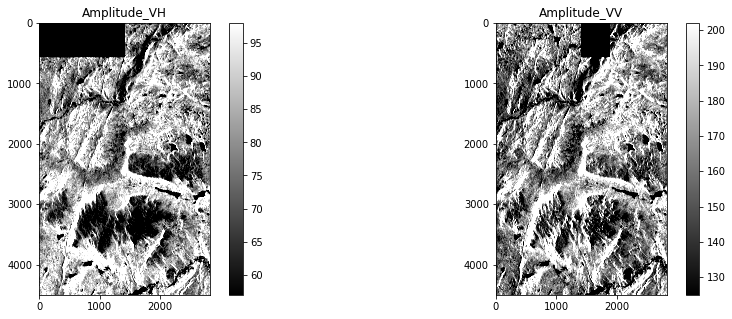

In [7]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_sbs.dim")
output_view(Product, band_i=['Amplitude_VH','Amplitude_VV'])

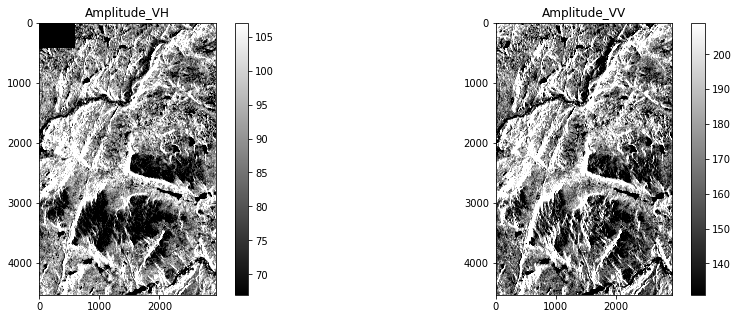

In [8]:
Product     = snappy.ProductIO.readProduct(fname[1] +"_sbs.dim")
output_view(Product, band_i=['Amplitude_VH','Amplitude_VV'])

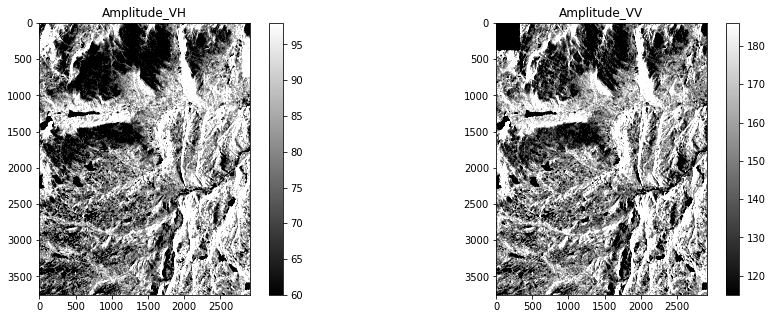

In [9]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_sbs.dim")
output_view(Product, band_i=['Amplitude_VH','Amplitude_VV'])

<html>
 <head>
 </head>
 <body>
     <p style="color:blue;font-size:15px"> apply orbit file</p>
 </body>
</html>

In [40]:
# function for apply orbit file
# INPUTS
# S1_files_subset is output from subset function S1_subset(i, AOI)
# format_data is optional (default is "_sbs_geo.dim")

def S1_orbit(S1_files_subset, format_data=None, format_out = None, Prg=True):
    if format_data is None:
        format_data = "_sbs.dim"
        
    if format_out is None:
        format_out = "_orb.dim"
        
    if Prg is True:
        print('Processing ' +  S1_files_subset + format_data)
        
    Product     = snappy.ProductIO.readProduct(S1_files_subset + format_data)
    parameters = snappy.HashMap()
    parameters.put('Apply-Orbit-File', True)
    parameters.put('continueOnFail', True)
    Product = snappy.GPF.createProduct('Apply-Orbit-File', parameters, Product)
    snappy.ProductIO.writeProduct(Product, S1_files_subset + format_out, "BEAM-DIMAP")

In [41]:
# executing funtion for subset with multiple S1 files
# use index to execute only some files, i.e., fname[0:4]

for i in fname[0:4]:
    S1_orbit(i)
    

Processing 20211113T053925_sbs.dim
Processing 20211113T165442_sbs.dim
Processing 20211118T054735_sbs.dim
Processing 20211118T170249_sbs.dim


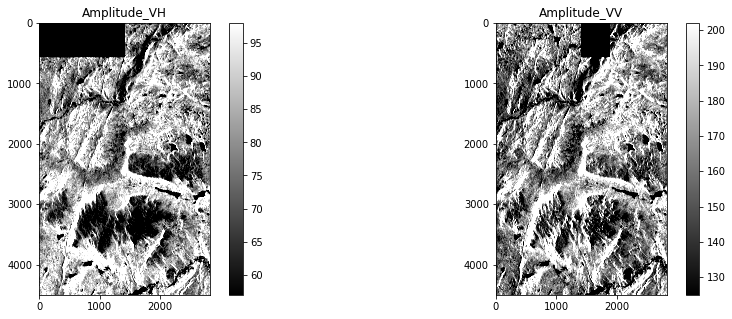

In [13]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_orb.dim")
output_view(Product, band_i=['Amplitude_VH','Amplitude_VV'])

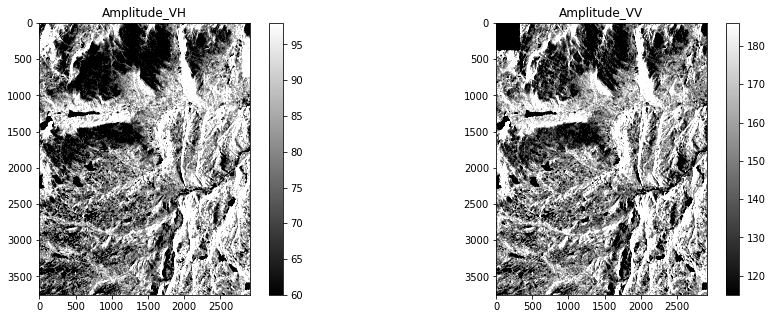

In [14]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_orb.dim")
output_view(Product, band_i=['Amplitude_VH','Amplitude_VV'])

<html>
 <head>
 </head>
 <body>
     <p style="color:blue;font-size:15px"> Thermal noise removal</p>
 </body>
</html>

In [42]:
# Thermal Noise Removal
#________________________

def S1_TNR(S1_files_orbit, format_data=None, format_out = None, Prg=True):
    if format_data is None:
        format_data = "_orb.dim"
        
    if format_out is None:
        format_out = "_TNR.dim"
        
    if Prg is True:
        print('Processing ' +  S1_files_orbit + format_data)
        
    Product     = snappy.ProductIO.readProduct(S1_files_orbit + format_data)
    parameters = snappy.HashMap()
    parameters.put('removeThermalNoise', True)
    Product = snappy.GPF.createProduct('ThermalNoiseRemoval', parameters, Product)
    snappy.ProductIO.writeProduct(Product, S1_files_orbit + format_out, "BEAM-DIMAP")

In [43]:
# executing function

for i in fname[0:4]:
    S1_TNR(i)

Processing 20211113T053925_orb.dim
Processing 20211113T165442_orb.dim
Processing 20211118T054735_orb.dim
Processing 20211118T170249_orb.dim


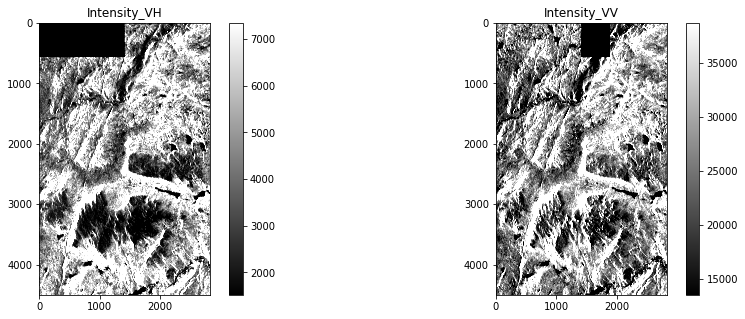

In [17]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_TNR.dim")
output_view(Product)

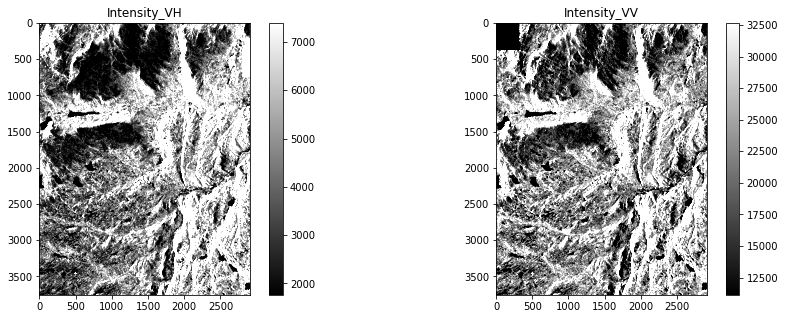

In [18]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_TNR.dim")
output_view(Product)

<html>
 <head>
 </head>
 <body>
     <p style="color:blue;font-size:15px">Radiometric calibration</p>
     <p style="color:red"> - If you have already calibrated then no you don’t need the normalization in terrain correction. Normalization is essentially calibration with the local incidence angle.<a href="https://forum.step.esa.int/t/s1-radiometric-correction/3191/6"  target="_blank"> reference </a>  </p>
     <p> - in older SNAP version, radiometric calibration is still needed to produce beta nought for radar simulation </p>
     <p> - in newer SNAP version (October 2022), simulated SAR can be obtained from radiometric terrain flattening (RTF)</p>
          <br/>
 </body>
</html>

In [44]:
# input: if beta is True (default) then the output is beta
#        otherwise e.g., False, then output is sigma

def S1_Rcal(S1_files, beta=None, format_data=None, format_out = None, Prg=True):
    
    if beta is None:
        beta = True
    
    if format_data is None:
        format_data = "_TNR.dim"
        
    if format_out is None:
        format_out = "_RCal.dim"
        
    if Prg is True:
        print('Processing ' +  S1_files + format_data)

    Product     = snappy.ProductIO.readProduct(S1_files + format_data)
    parameters = snappy.HashMap()
    
    if beta is True:
        parameters.put('outputBetaBand', True)
        parameters.put('outputSigmaBand', False)
    else:
        parameters.put('outputSigmaBand', True)
        
    parameters.put('sourceBands', 'Intensity_VH,Intensity_VV')
    parameters.put('selectedPolarisations', 'VH,VV')
    parameters.put('outputImageScaleInDb', False)
    Product = snappy.GPF.createProduct('Calibration', parameters, Product)
    snappy.ProductIO.writeProduct(Product, S1_files + format_out, "BEAM-DIMAP")

In [45]:
# executing function

for i in fname[0:4]:
    S1_Rcal(i)

Processing 20211113T053925_TNR.dim
Processing 20211113T165442_TNR.dim
Processing 20211118T054735_TNR.dim
Processing 20211118T170249_TNR.dim


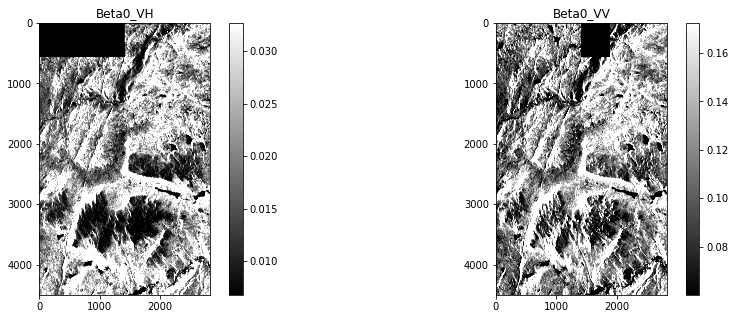

In [17]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_RCal.dim")
output_view(Product)

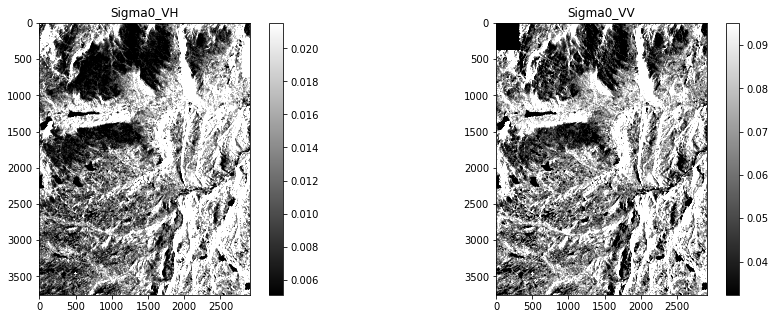

In [9]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_RCal.dim")
output_view(Product)

<html>
 <head>
 </head>
 <body>
     <p style="color:blue;font-size:15px"> Speckle filter</p>
     <p style="color:red"> <b> NOTE </b>  </p>
     <p> -LRW is already a multi-temporal stacking. </p>
     <p> - speckle filtering may be <u> unecessary </u> in this case</p>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
          <p> =================================================================================================</p>
     <a id='3.'></a>
     <p style="color:blue;font-size:20px"> 3. Radiative Transfer Model (RTM)</p>
     <p> =================================================================================================</p>
     <a id='3a'></a>
     <p style="color:blue;font-size:18px"> 3.a theory </p>
     <br/>
     <p> Flattening Gamma: Radiometric Terrain Correction for SAR Imagery by <a href="https://doi.org/10.1109/TGRS.2011.2120616"  target="_blank"> Small (2011) </a></p>
     <p> Full article is <a href="https://www.geo.uzh.ch/microsite/rsl-documents/research/publications/peer-reviewed-articles/201108-TGRS-Small-tcGamma-3809999360/201108-TGRS-Small-tcGamma.pdf"  target="_blank"> here </a></p> 
     <p> <u>summary</u>: Ellipsoid-based or sigma naught (σ<sup>0</sup>) based incident angle approximations that fail to reproduce the effect of topographic variation in their sensor model are contrasted with a new method that integrates terrain variations with the concept of gamma naught (γ<sup>0</sup>) backscatter, converting directly from beta naught (β<sup>0</sup>) to a newly introduced terrain-flattened γ<sup>0</sup> normalization convention.</p>
     <p> </p>
     <br/>
     <p style="color:blue"> <i>Gamma nought </i></p>
          <figure>
  <img src="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/5959279/5752845/5752845-fig-2-source-large.gif" alt="PA" style="width:50%">
  <figcaption> </figcaption>
    <figcaption><b></b> Figure 4f1-1: normalized areas for SAR backscatter (<a href="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/5959279/5752845/5752845-fig-2-source-large.gif"  target="_blank">Fig.2</a> in <a href="https://doi.org/10.1109/TGRS.2011.2120616"  target="_blank">Small 2011</a>)</figcaption>
</figure>
     <br/>
     <p> - Radar backscatter <i>β</i> is expressed as a ratio between the scattered power <i>P<sub>s</sub></i> and incident power <i>P<sub>i</sub></i> at ground level </p>
     <p> <i>β = P<sub>s</sub> / P<sub>i</sub> </i></p>
     <p> - When one chooses a reference area <i>A<sub>β</sub></i> (solid rectangle) defined to be in the slant range plane, one speaks of radar brightness, or <b>beta naught</b> <i>β<sup>0</sup></i> backscatter</p>
     <p> <i>β<sup>0</sup> = β / A<sub>β</sub> </i></p>
     <p> - If the reference area is defined to be ground area, i.e., locally tangent to an ellipsoidal model of the ground surface <i>A<sub>σ</sub></i> (dashed rectangle), then the result is <b>sigma naught</b> <i>σ<sup>0</sup><sub>E</sub></i></p>
     <p> <i> σ<sup>0</sup><sub>E</sub> &emsp; = &emsp;  β<sup>0</sup> . A<sub>β</sub> / A<sub>σ</sub> &emsp; = &emsp; β<sup>0</sup> sin θ<sub>E</sub> </i></p>
     <p> - If the reference area is instead defined to be in the plane perpendicular to the line of sight from sensor to an ellipsoidal model of the ground surface <i>A<sub>γ</sub></i> (dotted rectangle), then <b style="color:limegreen">gamma naught</b> <i>γ<sup>0</sup><sub>E</sub></i> is the result</p>
     <p> <i> γ<sup>0</sup><sub>E</sub> &emsp; = &emsp;  β<sup>0</sup> . A<sub>β</sub> / A<sub>γ</sub> &emsp; = &emsp; β<sup>0</sup> tan θ<sub>E</sub> </i></p>
     <p> - Note that a model of the Earth (i.e., <b>DEM</b>) is <b>required</b> to gain knowledge of the incident angle <i>θ<sub>E</sub> </i> to calculate sigma or <b style="color:limegreen">gamma naught</b>.</p>
     <p> _____________________________________________________________________________________________________</p>
     <br/>
          <figure>
  <img src="https://forum.step.esa.int/uploads/default/original/2X/f/f6a5980f160c27d7cbbfadf751196d58f59bc4e4.png" alt="PA" style="width:50%">
    <figcaption><b></b> Figure 4f1-2: normalized areas for SAR backscatter (post by <a href="https://forum.step.esa.int/uploads/default/original/2X/f/f6a5980f160c27d7cbbfadf751196d58f59bc4e4.png"  target="_blank">Abraun 3 Nov 17</a> in <a href="https://forum.step.esa.int/t/radiometric-geometric-correction-workflow/2540/71"  target="_blank">STEP forum</a>)</figcaption>
</figure>
     <br/>
     <p> - Gamma0 which use of the local incidence angle (blue angle, Fig. 4f1-2) from external Digital Elevation model (DEM) </p>
     <p> - The Radiometric Terrain Flattening in SNAP is based on an algorithm by <a href="https://doi.org/10.1109/TGRS.2011.2120616"  target="_blank"> Small (2011) </a> which does not use the (local) incidence angle but the area illuminated by the sensor of each pixel </p>
     <p> - Correcting for the angles before Terrain Flattening would kind of over-estimate the influence of surface orientation towards the sensor. Terrain Flattening therefore needs the basic calibration of Beta0 where the influence of incidence angle is still present </p>
     <p style="color:orange"> <b> NOTE</b> Since SNAP 8, conversion to Beta0 prior to Terrain Flattening is no longer required, because it has been integrated into the TF operator </p>
     <p style="color:red"> <b>  </b>  </p>
     <p> </p>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <p style="color:blue"> <i>local illuminated area </i></p>
<figure>
  <img src="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/5959279/5752845/5752845-fig-6-source-large.gif" alt="PA" style="width:50%">
    <figcaption><b></b> Figure 4f2-1: Projection of DEM facets into viewing plane (<a href="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/5959279/5752845/5752845-fig-6-source-large.gif"  target="_blank">Fig.6</a> in <a href="https://doi.org/10.1109/TGRS.2011.2120616"  target="_blank">Small 2011</a>)</figcaption>
</figure>
     <br/> 
     <p> - For each DHM (digital height model) facet at a given easting E and northing N coordinate, the corresponding <b style="color:limegreen">local illuminated area</b> <i>A<sub>γ</sub></i> may then be calculated using Heron's formula</p>
     <br/>
     <p style="color:red"> - <b> NOTE</b> In practical, may be generate <b style="color:limegreen">gamma nought</b> <i>γ<sup>0</sup><sub>E</sub></i> using SNAP and then estimate <b style="color:limegreen">local illuminated area</b> by reversing the <a href="https://doi.org/10.1109/TGRS.2011.2120616"  target="_blank">Eq. 3 in Small (2011)</a> (or in section <a href="#4f1"> 4.f.1 gamma nought</a>) and combining with the Eq. 1, becomes: </p>
          <p> <i> A<sub>γ</sub> &emsp; = &emsp;  β<sup>0</sup> . A<sub>β</sub> / γ<sup>0</sup><sub>E</sub> &emsp; = &emsp; β<sup>0</sup> . (β/β<sup>0</sup>) / γ<sup>0</sup><sub>E</sub> &emsp; = &emsp; β / γ<sup>0</sup><sub>E</sub> </i></p>
     <p style="color:red"> - <i>β</i> is raw radar backscatter</p>
     <p> - as in <a href="#4g3">4.g.3 local area by reversing</a> </p>
          <p> _____________________________________________________________________________________________________</p>
     <br/>
     <p style="color:purple"> <b> Practical solution</b> </p>
     <p> Source: sleinss post in 1st June 2020 in <a href="https://forum.step.esa.int/t/sar-simulation-terrain-correction-no-output-of-simulated-intensity/23513/12"  target="_blank">STEP forum</a></p>
     <p> - The ascending and descending images in the first and second row are <u>radiometrically terrain corrected</u> (<i>γ<sup>0</sup><sub>E</sub></i>) by dividing β<sup>0</sup> by the <b style="color:limegreen">simulated intensity</b> </p>
     <p> - Local Resolution Weighting (LRW) using the inverse of the <b style="color:limegreen">simulated intensity</b> as weight to combine ascending and descending orbits in order to obtain everywhere the best possible resolution </p>
     <p style="color:red"> Does this mean that <b style="color:limegreen">simulated intensity</b> is equal or proportional to <b style="color:limegreen">local illuminated area</b>? </p>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <a id='3b'></a>
     <p style="color:blue;font-size:18px"> 3.b application </p>
     <p> <b>NOTE</b>: RTF does not correct the error of geometric due to elevation gradient </p>
     <p>- RTF output still need geometric terrain correction later </p>
     <p>- RTF requires <b>beta nought</b> or <b>Ampltidue</b>, not Sigma nought </p>
     <br/>
               <p> more options for input are <a href="https://forum.step.esa.int/t/combining-radiometric-terrain-flattening-with-sarsim-terrain-correction/5811/2"  target="_blank">here </a> </p>
     <br/>
     <p> <b> INPUT</b> currently, input is from Thermal Noise Removal. No prior callibration </p>
     <p> <b> projection</b> image is stil in radar geometry </p>
 </body>
</html>

In [6]:
# external_DEM by default is 'SRTM 1Sec HGT'
# set sim = True to get simulated images as outputs

def S1_RTF(S1_files, DEM=None, sim=None, format_data=None, format_out=None, Prg=True):
    
    if sim is None:
        sim = False
    
    if format_data is None:
        format_data = "_TNR.dim"
        
    if format_out is None:
        format_out = "_rtf.dim"

    if Prg is True:
        print('Processing ' +  S1_files + format_data)      
        
    Product     = snappy.ProductIO.readProduct(S1_files + format_data)
    parameters = snappy.HashMap()
    parameters.put('reGridMethod', 'null')
    
    if DEM is None:
        parameters.put('demName', 'SRTM 1Sec HGT')
    else:
        parameters.put("demName", "External DEM")
        parameters.put("externalDEMFile", DEM)
        
    if sim is True:
        parameters.put("outputSimulatedImage", True)
        
    Product = snappy.GPF.createProduct("Terrain-Flattening", parameters, Product)
    snappy.ProductIO.writeProduct(Product, S1_files + format_out, "BEAM-DIMAP")

In [7]:
# executing function

for i in fname[0:4]:
    S1_RTF(i, DEM=DTM, sim=True, format_data='_Rcal.dim')

Processing 20211113T053925_Rcal.dim
Processing 20211113T165442_Rcal.dim
Processing 20211118T054735_Rcal.dim
Processing 20211118T170249_Rcal.dim


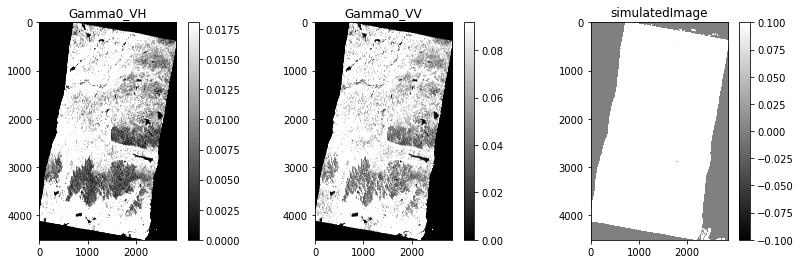

In [8]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_rtf.dim")
output_view(Product)

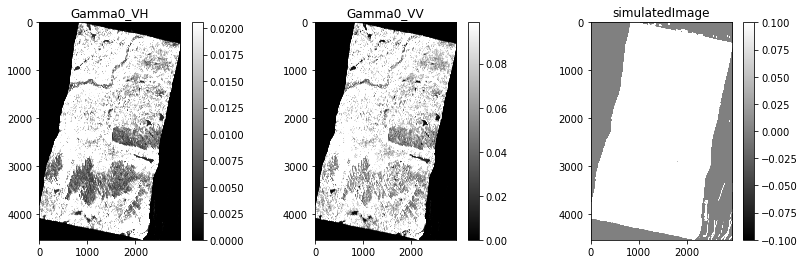

In [13]:
Product     = snappy.ProductIO.readProduct(fname[1] +"_rtf.dim")
output_view(Product)

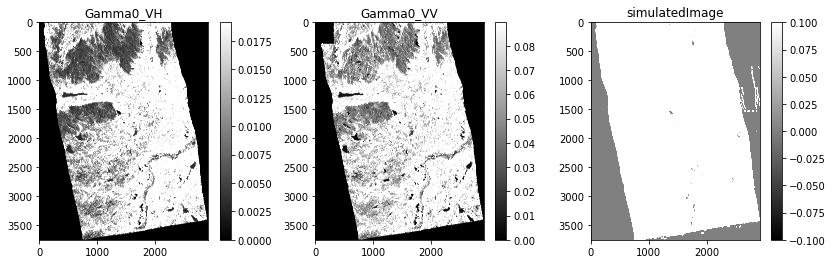

In [14]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_rtf.dim")
output_view(Product)

<html>
 <head>
 </head>
 <body>
     <p style="color:blue"> <i>Geometric terrain correction </i></p>
     <p> <b>NOTE</b>: </p>
     <p> - Gamma nought is already terrain corrected, but without geometric correction</p>
     <br/>
 </body>
</html>

In [9]:
# set proj = 'EPSG:25832' to get the output in that projection
# by default, saptial resolution is 10 m for Sentinel 1
# set format_out = 'tif' for output in geotif
# rad_norm is radiometric normalisation. default is False

def S1_gtc(S1_files, DEM=None, proj=None, SR=None, rad_norm=False, format_data=None, format_out=None, Prg=True):
    
    if format_data is None:
        format_data = "_rtf.dim"
        
    if format_out is None:
        format_out = "_geo.dim"
        
    if Prg is True:
        print('Processing ' +  S1_files + format_data)  

    Product     = snappy.ProductIO.readProduct(S1_files + format_data)
    parameters = snappy.HashMap()
    
    if DEM is None:
        parameters.put('demName', 'SRTM 1Sec HGT')
    else:
        parameters.put("demName", "External DEM")
        parameters.put("externalDEMFile", DEM)
        
        
    if proj is not None:
        parameters.put("mapProjection", proj)
        
    if SR is not None:
        parameters.put("pixelSpacingInMeter", SR)

    parameters.put("applyRadiometricNormalization", rad_norm)
        
    Product = snappy.GPF.createProduct('Terrain-Correction', parameters, Product)
    
    if format_out is "tif":
        snappy.ProductIO.writeProduct(Product, S1_files + '_geo.tif', 'geotiff')
    else:
        snappy.ProductIO.writeProduct(Product, S1_files + format_out, "BEAM-DIMAP")

In [10]:
for i in fname[0:4]:
    S1_gtc(i, DTM, "EPSG:25832")

Processing 20211113T053925_rtf.dim
Processing 20211113T165442_rtf.dim
Processing 20211118T054735_rtf.dim
Processing 20211118T170249_rtf.dim


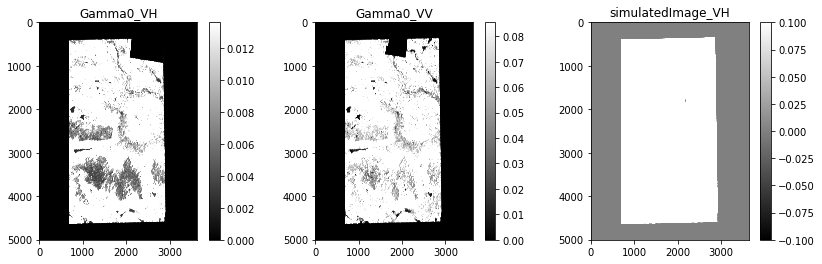

In [22]:
Product     = snappy.ProductIO.readProduct(fname[0] +"_geo.dim")
output_view(Product)

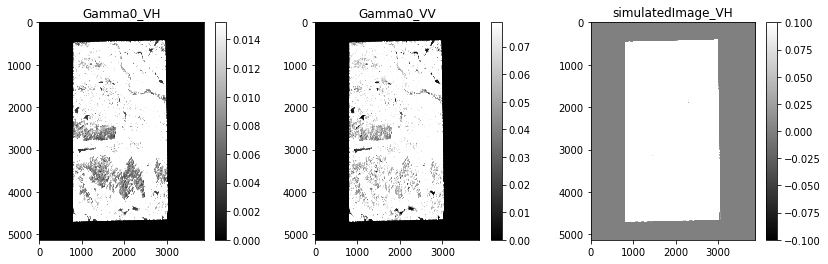

In [23]:
Product     = snappy.ProductIO.readProduct(fname[1] +"_geo.dim")
output_view(Product)

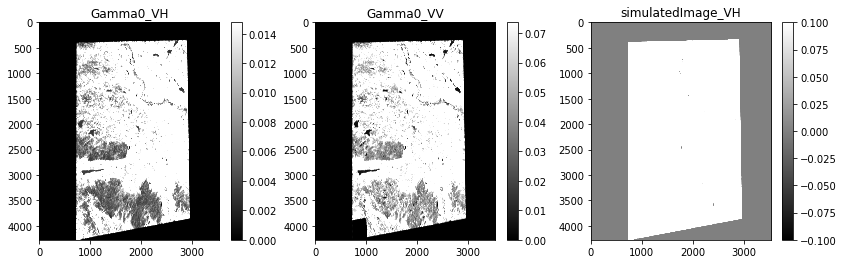

In [24]:
Product     = snappy.ProductIO.readProduct(fname[2] +"_geo.dim")
output_view(Product)

In [5]:
# ellipsoid correction is used if DEM is not available.
# however, the output is remain distorted in unudlated area

def S1_geo(S1_files, proj=None, format_data=None, format_out=None):
    if format_data is None:
        format_data = "_rtf.dim"
        
    if format_out is None:
        format_out = "_gec.dim"

    Product     = snappy.ProductIO.readProduct(S1_files + format_data)
    parameters = snappy.HashMap()
        
    Product = snappy.GPF.createProduct("Ellipsoid-Correction-GG", parameters, Product)
    snappy.ProductIO.writeProduct(Product, S1_files + format_out, "BEAM-DIMAP")

In [6]:
for i in fname:
    S1_geo(i)

<html>
 <head>
 </head>
 <body>
               <p> =================================================================================================</p>
     <a id='4.'></a>
     <p style="color:blue;font-size:20px"> 4. local resolution weighting (LWR)</p>
     <p> =================================================================================================</p>
     <a id='4a'></a>
     <p style="color:blue;font-size:18px"> 4.a theory </p>
     <p> <b> Background </b> by <a href="https://doi.org/10.1109/TGRS.2021.3055562"  target="_blank">Small et al. (2021)</a> </p>
     <p> - Although the distortion in the local radar brightness is strongly mitigated in the <a href="#4f">RTC case (4.f.)</a>, the poor local resolution remains on the foreslopes.</p>
     <p> - the highly variable local resolution of radar imagery in mountainous terrain is dealt with by combining multiple data acquisitions acquired from differing geometries (i.e., Ascending versus descending acqusition).</p>
     <p> - LRW combines all available data into a local backscatter estimate based on a weighting appropriate for the local terrain distortions applicable within each contributing image product.</p>
     <br/>
     <p style="color:red"> <b> ISSUE </b>  </p>
     <p> - Note that <b>radar shadow</b> is not common in Sentinel-1 geometries: the example shown contains some of the <b>steepest terrain</b> in Europe, particularly the Lauterbrunnen valley south of Interlaken.</p>
     <p> - Input images where the location in question is subject to radar shadow are <b>not included</b>, as they do not offer an observation. </p>
     <p> - Radar shadow can also reduce the number of local observations in areas affected by steep terrain.</p>
     <p> - Widening the temporal window improves the number of observations available, but also increases susceptibility to the introduction of uncertainties caused by natural variability within the time span of the window. <u>narrow time windows</u> are <b>preferred</b> when possible</p>
     <p> - Local Quality: Composite Local Resolution in section D</p>
      <p> - Rather than applying the weights to each input RTC image, for these products, the weights are instead applied to the local contributing areas (originally used to generate the RTC products) to produce a map of the weighted relative area within the LRW-composite. High values indicate relatively high (good) resolution, low values indicate relatively coarse local resolution.</p>
     <br/>
     <p> <b> Method </b>  </p>
     <p> - developed by <a href="https://www.geo.uzh.ch/microsite/rsl-documents/research/publications/other-sci-communications/DavidSmall_IGARSS2012-LocalResolutionWeighting-3038842368/DavidSmall_IGARSS2012-LocalResolutionWeighting.pdf"  target="_blank"> Small (2012)</a>; <a href="https://doi.org/10.1109/TGRS.2021.3055562"  target="_blank">Small et al. (2021) </a></p>
     <p> - slopes facing away from the sensor should be given more weight which is implicitly already done by LRW (<a href="https://doi.org/10.5194/nhess-20-1783-2020"  target="_blank">Leinss et al. 2020</a>). layover areas lighten up the relatively dark slopes facing away from the radar</p>
     <br/>
     <figure>
  <img src="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/9633014/9352976/small6-3055562-large.gif" alt="PA" style="width:70%">
    <figcaption><b></b> Figure 4g1-1: Flowchart of LRW Backscatter Composite Processing starting with inputs DHM and SAR <i>β<sup>0</sup></i> backscatter (<a href="https://ieeexplore.ieee.org/mediastore_new/IEEE/content/media/36/9633014/9352976/small6-3055562-large.gif"  target="_blank">Fig.6</a> in <a href="https://doi.org/10.1109/TGRS.2021.3055562"  target="_blank">Small et al. (2021)</a>)</figcaption>
</figure>
     <p> - From the DHM and SAR backscatter inputs, image simulation is used to estimate the <b style="color:limegreen">local illuminated area</b> in radar geometry, then used to normalize the backscatter </p>
     <br/>
     <p> - Given a local set of <i>M</i> nonshadowed input RTC image samples <i>γ<sup>0</sup><sub>1</sub>…γ<sup>0</sup><sub>M</sub></i> , for each image <i>i</i> with a local area <i>A<sub>i</sub></i> , the sum of the available resolutions is</p>
     <p> &emsp; <i style="font-size:18px">S<sub>r</sub> = <sup>M</sup>∑<sub>j=1</sub> 1 / A<sub>j</sub></i></p>
     <p> - The weight <i>W<sub>i</sub></i> to be applied to each image <i>i</i> is then</p>
     <p> &emsp; <i style="font-size:18px">W<sub>i</sub> = S<sub>r</sub> . 1 / A<sub>i</sub></i></p>
     <p> - Given that all weights <i>W<sub>1</sub>…W<sub>M</sub></i> are now available, for any given map geometry sample location, the composite’s backscatter estimate <i>γ<sub>c</sub></i> is the weighted sum of all <i>M</i> available input RTC backscatter values</p>
     <p> <i style="font-size:18px">γ<sub>c</sub> = <sup>M</sup>∑<sub>i=1</sub> W<sub>i</sub> ⋅ γ<sup>0</sup><sub>i</sub></i></p>
     <p> - </p>
     <p> _____________________________________________________________________________________________________</p>
     <br/>
     <p> SAR BACKSCATTER MULTITEMPORAL COMPOSITING VIA LOCAL RESOLUTION WEIGHTING by <a href="https://www.geo.uzh.ch/microsite/rsl-documents/research/publications/other-sci-communications/DavidSmall_IGARSS2012-LocalResolutionWeighting-3038842368/DavidSmall_IGARSS2012-LocalResolutionWeighting.pdf"  target="_blank"> Small (2012)</a></p>
     <p> - the resolution of each image is estimated locally as the <u>inverse of the local contributing area</u> and used to weight the contributions from all available observations</p>
     <p> - one can partially compensate for the effects of spatially varying local resolution by <u>combining ascending and descending</u> views of the same scene</p>
     <p> - the local illuminated area is inversely proportional to the local image resolution</p>
     <p> - Images with the highest available local resolution receive the highest local weights</p>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <a id='4b'></a>
     <p style="color:blue;font-size:18px"> 4.b application </p>
     <br/>
     <p> <b> NOTE</b> - set output in Geotiff and set the output to retrieve the name of bands in stacked file </p>
     <p> <b> Inputs</b> are geocoded gamma nought </p>
 </body>
</html>

In [11]:
# set format_out = 'tif' for output in geotif
#               if product is geotiff, additional output is list of band name for processing

def S1_stack(S1_files, output_name=None, format_data=None, format_out=None):

    
    if output_name is None:
        output_name = "Stacked"
        
    if format_data is None:
        format_data = "_geo.dim"

    if format_out is None:
        format_out = "_stack.dim"
        
    product_set=[]

    for f in S1_files:
        product_set.append(snappy.ProductIO.readProduct(f + format_data))
      
    params = HashMap()
    params.put('resamplingType', None)
    params.put('initialOffsetMethod', 'Product Geolocation')
    params.put('extent', 'Master')
   
    Product = snappy.GPF.createProduct('CreateStack', params, product_set)
    
    if format_out is "tif":
        snappy.ProductIO.writeProduct(Product, output_name + '_geo.tif', 'geotiff')
        
        band_list = list(Product.getBandNames())
        
        return(band_list)     
        
    else:
        snappy.ProductIO.writeProduct(Product, output_name + format_out, "BEAM-DIMAP")
        


In [12]:
fname

['20211113T053925',
 '20211113T165442',
 '20211118T054735',
 '20211118T170249',
 '20211119T054015',
 '20211124T054825',
 '20211124T170332',
 '20211130T054734',
 '20211130T170248',
 '20211201T054015',
 '20211201T165522',
 '20211206T054824',
 '20211206T170332',
 '20211207T053924']

Storm is at 19 November 2021. we pick fname(0:4) for pre-strom and fname(5:9) for post-storm

In [15]:
# to save in SNAP format


# S1_stack(fname[0:4], 'Pre_storm')
# S1_stack(fname[5:9], 'Post_storm')

In [19]:
# nevertheless, we will save it as geotiff to execute LRW in snappy
# geotiff lost the filename of bands, so we have to return output of the band names

dft_band_prs = S1_stack(fname[0:4], 'Pre_storm', format_out='tif')
dft_band_pos = S1_stack(fname[5:9], 'Post_storm', format_out='tif')

In [20]:
print(dft_band_prs)

['Gamma0_VH_mst_13Nov2021', 'Gamma0_VV_mst_13Nov2021', 'simulatedImage_VH_mst_13Nov2021', 'Gamma0_VH_slv1_18Nov2021', 'Gamma0_VV_slv2_18Nov2021', 'simulatedImage_VH_slv3_18Nov2021', 'Gamma0_VH_slv4_13Nov2021', 'Gamma0_VV_slv5_13Nov2021', 'simulatedImage_VH_slv6_13Nov2021', 'Gamma0_VH_slv7_18Nov2021', 'Gamma0_VV_slv8_18Nov2021', 'simulatedImage_VH_slv9_18Nov2021']


In [21]:
print(dft_band_pos)

['Gamma0_VH_mst_24Nov2021', 'Gamma0_VV_mst_24Nov2021', 'simulatedImage_VH_mst_24Nov2021', 'Gamma0_VH_slv1_30Nov2021', 'Gamma0_VV_slv2_30Nov2021', 'simulatedImage_VH_slv3_30Nov2021', 'Gamma0_VH_slv4_24Nov2021', 'Gamma0_VV_slv5_24Nov2021', 'simulatedImage_VH_slv6_24Nov2021', 'Gamma0_VH_slv7_30Nov2021', 'Gamma0_VV_slv8_30Nov2021', 'simulatedImage_VH_slv9_30Nov2021']


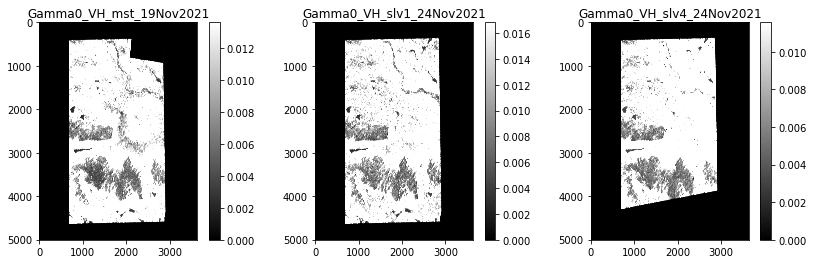

In [13]:
Product     = snappy.ProductIO.readProduct('Pre_strom' +"_stack.dim")
output_view(Product, band_o=[1, 4, 7])

<html>
 <head>
 </head>
 <body>
     <p style="color:blue"> <i>weighting factors in snappy </i></p>
     <p> <b> NOTE</b> </p>
     <p> - simulated inetnsity from 'radiometric terrain flattening' is used as wighting factor </p>
     <br/>
     <p style="color:red"> <b> ISSUE</b> band math does not ignore NA values </p>
     <p> - equation does not work for zero (0) simulated intensity </p>
     <p> - do raster algebra using rasterio and numpy instead </p>
 </body>
</html>

In [23]:
def S1_LRW(stacked_S1, pol=None, format_data=None, format_out=None):
    
    if pol is None:
        pol = "VH"
    
    if format_data is None:
        format_data = "_stack.dim"
        
    if format_out is None:
        format_out = "_lrw.dim"
        
    S1_file     = snappy.ProductIO.readProduct(stacked_S1 +"_stack.dim")
    
    band_list = list(S1_file.getBandNames())
    
    # getting the simulated intensity
    sim = []
    for band in band_list:
        if band.startswith('simulatedImage'):
            sim.append(band)
            
    # getting the spesific band 
    pol_b = []
    for band in band_list:
        if 'Gamma0' in band and pol in band:
            pol_b.append(band)
    
    GPF.getDefaultInstance().getOperatorSpiRegistry().loadOperatorSpis()

    BandDescriptor = jpy.get_type('org.esa.snap.core.gpf.common.BandMathsOp$BandDescriptor')

    targetBand1 = BandDescriptor()
    targetBand1.name = pol + '_lrw'
    targetBand1.type = 'float32'
    Sr ='0 '
    for s in sim:
        Sr = Sr + ' + ' + '1/' + s 
        
    s = 0
    p_t = '0 '
    for p in pol_b:
        pp = p + ' / (' + Sr + ') / ' + sim[s]
        s = s + 1
        p_t = p_t + '+ (' + pp + ') '
        
    targetBand1.expression = p_t

    targetBands = jpy.array('org.esa.snap.core.gpf.common.BandMathsOp$BandDescriptor', 1)
    targetBands[0] = targetBand1

    parameters = HashMap()
    parameters.put('targetBands', targetBands)

    result = snappy.GPF.createProduct('BandMaths', parameters, S1_file)

    snappy.ProductIO.writeProduct(result, stacked_S1 + '_' + pol + format_out, "BEAM-DIMAP")
        
    #print(equation)
    

In [24]:
S1_LRW('Pre_storm')
S1_LRW('Pre_storm', 'VV')
S1_LRW('Post_storm')
S1_LRW('Post_storm', 'VV')

RuntimeError: java.io.FileNotFoundException: File not found: Pre_storm_stack.dim

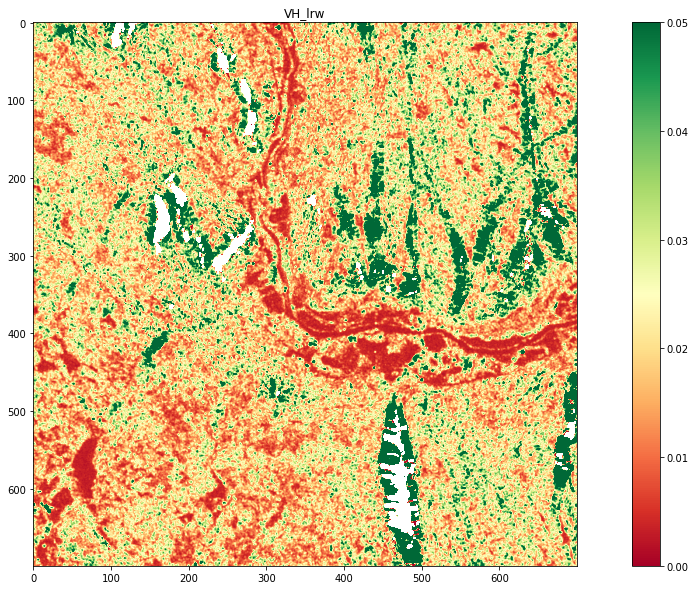

In [63]:
Product     = snappy.ProductIO.readProduct('Pre_strom' +"_VH_lrw.dim")
output_view(Product, minV=0, maxV=0.05, dim=[1700, 1200, 700, 700], warna='RdYlGn', ukuran=(20,10))

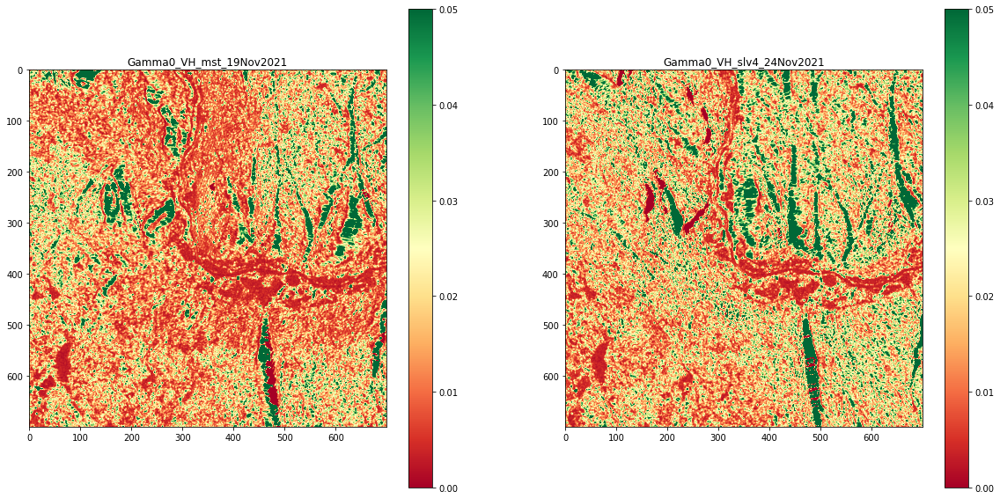

In [64]:
Product     = snappy.ProductIO.readProduct('Pre_strom' +"_stack.dim")
output_view(Product, band_o=[1, 7], minV=0, maxV=0.05, dim=[1700, 1200, 700, 700], warna='RdYlGn', ukuran=(20,10))

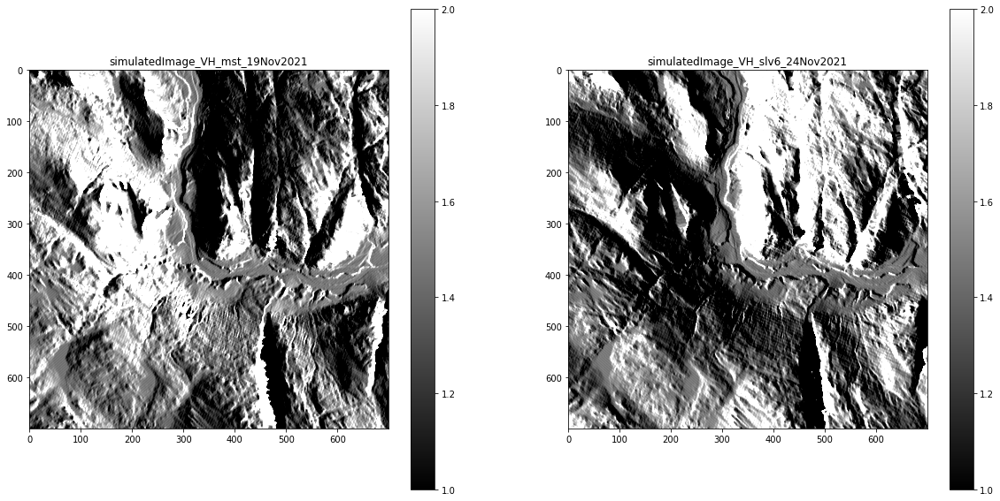

In [65]:
Product     = snappy.ProductIO.readProduct('Pre_strom' +"_stack.dim")
output_view(Product, band_o=[3, 9], minV=1, maxV=2, dim=[1700, 1200, 700, 700], ukuran=(20,10))

<html>
 <head>
 </head>
 <body>
     <p style="color:blue"> <i>weighting factors: rasterio and numpy libraries </i></p>
     <p> <b> NOTE</b> </p>
     <p> - simulated inetnsity from  radiometric terrain flatteningis used as wighting factor </p>
     <p> - this need <b> rasterio</b> and <b> numpy</b> libraries </p>
     <p> - tutorial for <a href="https://geobgu.xyz/py/rasterio.html"  target="_blank"> rasterio </a>, <a href="https://automating-gis-processes.github.io/CSC/notebooks/L5/reading-raster.html"  target="_blank"> here</a>, <a href="https://geohackweek.github.io/raster/04-workingwithrasters/"  target="_blank">here</a> and the <a href="https://rasterio.readthedocs.io/en/latest/topics/reading.html"  target="_blank">official</a></p>
     <p> - tutorial for <a href="https://cs231n.github.io/python-numpy-tutorial/#numpy"  target="_blank"> numpy </a> and <a href="https://www.youtube.com/watch?v=QUT1VHiLmmI"  target="_blank"> youtube </a></p>
     <p style="color:red"> - Gamma nought is not in dB yet</p>
     <br/>
     <p style="color:red"> <b> ISSUE</b> </p>
     <p> - it seems there is no way to get the band name using rasterio. may be geotiff does not allow to have band name index? </p>
     <p> - for the moment, the variable for list of band name (<b> dft_band</b>) is originally obtained from output in 'stacking' </p>
     <p> - visualisation in <b>Gif</b> </p>
     <p> - LRW does not work very well in extreme terrain. Basically, LRW weight more for pixel in backslope (weak intensity). This is, however, problematic in case the back slope become layover/shadow </p>
     <p> - may be set the minimum simulated intensity? 0.02?</p>
 </body>
</html>

In [25]:

def S1_LRW_b(tif_file, band_list, pol=None, treshold=None, output_name=None):
    
    if pol is None:
        pol = "VH"
        
    if treshold is None:
        treshold = 0.0
        
    if output_name is None:
        output_name = 'LRW_' + pol + '_' + tif_file            
        
    with rasterio.open(tif_file) as stack:
        # meta = stack.meta getting the metadata 
        all_band = stack.read() # this is a numpy array
    
    # getting the simulated intensity
    sim = []
    sim_n = []
    itr = 0
    for band in band_list:
        if band.startswith('simulatedImage'):
            sim.append(itr)
        else:
            sim_n.append(itr)
        itr = itr + 1
            
    # getting the spesific band with spesific polarization
    pol_b = []
    pol_bn = []
    itr = 0
    for band in band_list:
        if 'Gamma0' in band and pol in band:
            pol_b.append(itr)
        else:
            pol_bn.append(itr)
        itr = itr + 1
            
    band_VH = np.delete(all_band, pol_bn, axis=0)
    band_sim = np.delete(all_band, sim_n, axis=0)
    
    band_sim[band_sim == 0.0] = np.nan # remove value of zero
    band_sim[band_sim < treshold] = np.nan # remove value below treshold
    
    # create the total simulation
    LA = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = 1/band_sim[i]
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LA = LA + temp
        
    # calculate LRW
    LRW = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = 1/band_sim[i]
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        temp = band_VH[i] * temp / LA
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LRW = LRW + temp 
        
    new_dataset = rasterio.open(output_name, 'w', driver='GTiff',
        height = stack.height, width = stack.width,
        count=1, dtype=str(LRW.dtype),
        crs=stack.crs,
        transform=stack.transform)

    new_dataset.write(LRW, 1)
    new_dataset.close()

In [6]:
dft_band = ['Gamma0_VH_mst_30Nov2021', 'Gamma0_VV_mst_30Nov2021', 'simulatedImage_VH_mst_30Nov2021', 'Gamma0_VH_slv1_07Dec2021', 'Gamma0_VV_slv2_07Dec2021', 'simulatedImage_VH_slv3_07Dec2021', 'Gamma0_VH_slv4_30Nov2021', 'Gamma0_VV_slv5_30Nov2021', 'simulatedImage_VH_slv6_30Nov2021', 'Gamma0_VH_slv7_06Dec2021', 'Gamma0_VV_slv8_06Dec2021', 'simulatedImage_VH_slv9_06Dec2021', 'Gamma0_VH_slv10_06Dec2021', 'Gamma0_VV_slv11_06Dec2021', 'simulatedImage_VH_slv12_06Dec2021', 'Gamma0_VH_slv13_01Dec2021', 'Gamma0_VV_slv14_01Dec2021', 'simulatedImage_VH_slv15_01Dec2021', 'Gamma0_VH_slv16_01Dec2021', 'Gamma0_VV_slv17_01Dec2021', 'simulatedImage_VH_slv18_01Dec2021', 'Gamma0_VH_slv19_19Nov2021', 'Gamma0_VV_slv20_19Nov2021', 'simulatedImage_VH_slv21_19Nov2021', 'Gamma0_VH_slv22_24Nov2021', 'Gamma0_VV_slv23_24Nov2021', 'simulatedImage_VH_slv24_24Nov2021', 'Gamma0_VH_slv25_24Nov2021', 'Gamma0_VV_slv26_24Nov2021', 'simulatedImage_VH_slv27_24Nov2021']

In [26]:
S1_LRW_b('Pre_storm_geo.tif', dft_band_prs)
S1_LRW_b('Pre_storm_geo.tif', dft_band_prs,  'VV')
S1_LRW_b('Post_storm_geo.tif', dft_band_pos)
S1_LRW_b('Post_storm_geo.tif', dft_band_pos,  'VV')

# play with treshold

#S1_LRW_b('Pre_storm_geo.tif', dft_band,  treshold=0.1, output_name="LRW_VH_Pre_strom_geo_01.tif")

C:\ProgramData\Anaconda3\envs\python36\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: invalid value encountered in true_divide


Text(0, 0.5, 'Row #')

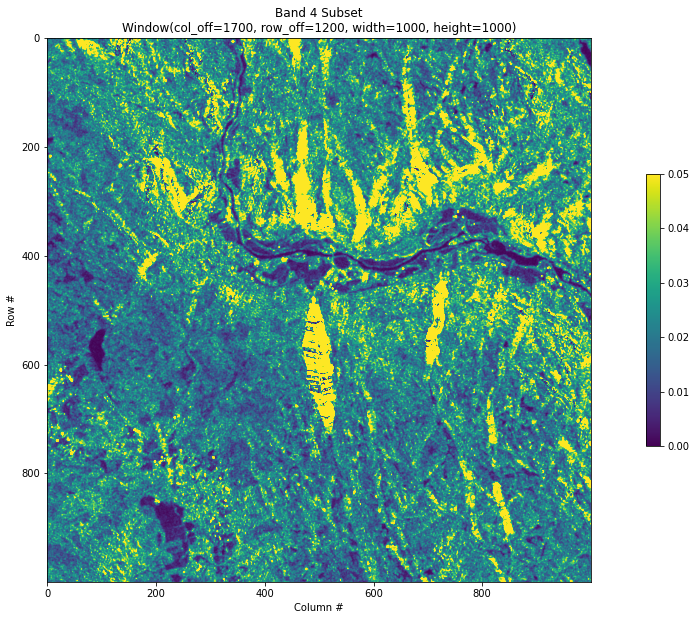

In [27]:
window = rasterio.windows.Window(1700, 1200, 1000, 1000)

with rasterio.open('LRW_VH_Pre_storm_geo.tif') as stack:
    VH_1 = stack.read(1, window=window)
    # meta = stack.meta getting the metadata 

plt.figure(figsize=(20,10))
plt.imshow(VH_1, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')
    

Text(0, 0.5, 'Row #')

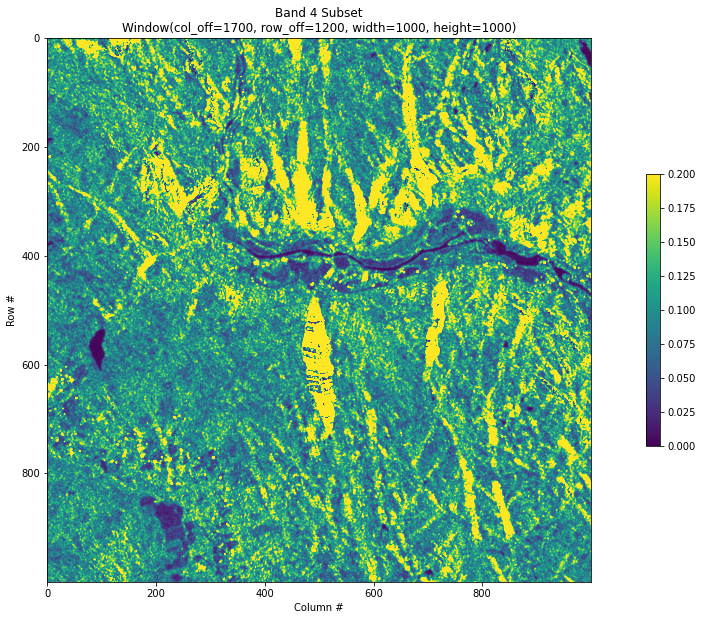

In [32]:
window = rasterio.windows.Window(1700, 1200, 1000, 1000)

with rasterio.open('LRW_VV_Pre_storm_geo.tif') as stack:
    VH_1 = stack.read(1, window=window)

plt.figure(figsize=(20,10))
plt.imshow(VH_1, vmin=0, vmax=0.2)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

<html>
 <head>
 </head>
 <body>
     <p style="color:limegreen"> <b>INTERPRETATION </b></p>
     <p> - algorithme currently does not work in extreem slope. it weight high to area in shadow</p>
     <p style="color:red"> - maybe set a maximum Gamma nought? check what is the maximum values in those areas and what is the simulated intensity</p>
 </body>
</html>

In [33]:
# getting the statistic of DN and corresponding simulated intensity from multi-bands

def raster_stat(tif_file, band_list, mode='median', pol=None, output_name=None):

    if pol is None:
        pol = "VH"
        
    if output_name is None:
        output_name = mode + '_' + tif_file 
    
    with rasterio.open(tif_file) as stack:
        all_band = stack.read() # this is a numpy array
    
    # getting the simulated intensity
    sim = []
    sim_n = []
    itr = 0
    for band in band_list:
        if band.startswith('simulatedImage'):
            sim.append(itr)
        else:
            sim_n.append(itr)
        itr = itr + 1
            
    # getting the spesific band with spesific polarization
    pol_b = []
    pol_bn = []
    itr = 0
    for band in band_list:
        if 'Gamma0' in band and pol in band:
            pol_b.append(itr)
        else:
            pol_bn.append(itr)
        itr = itr + 1
            
    band_VH = np.delete(all_band, pol_bn, axis=0)
    band_sim = np.delete(all_band, sim_n, axis=0)  
    
    temp = np.zeros((band_VH.shape[1], band_VH.shape[2]))
    
    if mode == 'max':
        temp= np.max(band_VH, axis = 0)
    elif mode == 'median':
        temp= np.median(band_VH, axis = 0)
    elif mode == 'mean':
        temp= np.mean(band_VH, axis = 0)
    elif mode == 'min':
        temp= np.min(band_VH, axis = 0)
    elif mode == 'sum':
        temp= np.sum(band_VH, axis = 0)
    
    new_dataset = rasterio.open(output_name, 'w', driver='GTiff',
        height = stack.height, width = stack.width,
        count=1, dtype=str(temp.dtype),
        crs=stack.crs,
        transform=stack.transform)

    new_dataset.write(temp, 1)
    new_dataset.close()

In [35]:
raster_stat('Pre_storm_geo.tif', dft_band_prs, mode='median')

Text(0, 0.5, 'Row #')

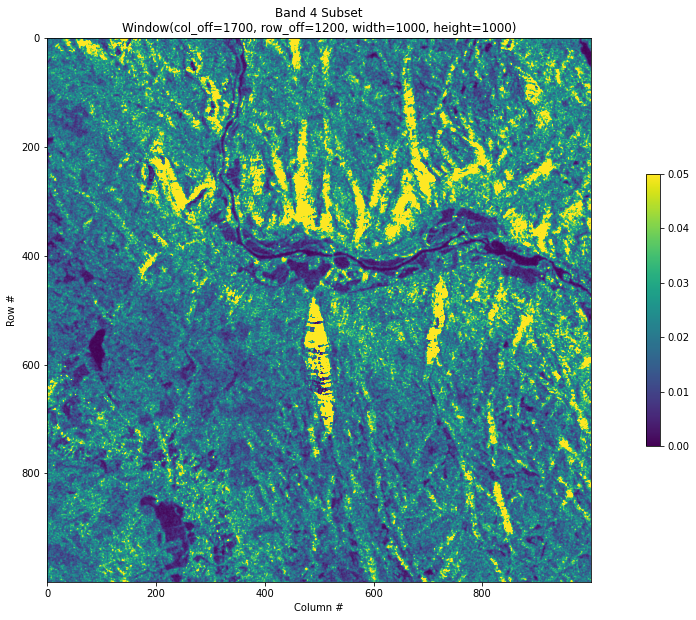

In [36]:
window = rasterio.windows.Window(1700, 1200, 1000, 1000)

with rasterio.open('median_Pre_storm_geo.tif') as stack:
    VH_1 = stack.read(1, window=window)

plt.figure(figsize=(20,10))
plt.imshow(VH_1, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

<html>
 <head>
 </head>
 <body>
     <p style="color:limegreen"> <b>INTERPRETATION </b></p>
     <p> - median seems is better output. median can recognise outliers</p>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <p style="color:red"> <b>scripts bellow are trials </b></p>
 </body>
</html>

In [8]:
# old function without treshold

def S1_LRW_b(tif_file, band_list, pol=None):
    
    if pol is None:
        pol = "VH"
        
    with rasterio.open(tif_file) as stack:
        # meta = stack.meta getting the metadata 
        all_band = stack.read() # this is a numpy array
    
    # getting the simulated intensity
    sim = []
    sim_n = []
    itr = 0
    for band in band_list:
        if band.startswith('simulatedImage'):
            sim.append(itr)
        else:
            sim_n.append(itr)
        itr = itr + 1
            
    # getting the spesific band with spesific polarization
    pol_b = []
    pol_bn = []
    itr = 0
    for band in band_list:
        if 'Gamma0' in band and pol in band:
            pol_b.append(itr)
        else:
            pol_bn.append(itr)
        itr = itr + 1
            
    band_VH = np.delete(all_band, pol_bn, axis=0)
    band_sim = np.delete(all_band, sim_n, axis=0)
    
    # create the total simulation
    LA = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = 1/band_sim[i]
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LA = LA + temp
        
    # calculate LRW
    LRW = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = 1/band_sim[i]
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        temp = band_VH[i] * temp / LA
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LRW = LRW + temp 
        
    new_dataset = rasterio.open('LRW_' + pol + '_' + tif_file, 'w', driver='GTiff',
        height = stack.height, width = stack.width,
        count=1, dtype=str(LRW.dtype),
        crs=stack.crs,
        transform=stack.transform)

    new_dataset.write(LRW, 1)
    new_dataset.close()

in this function below, value belo treshold is replaced as zero

In [10]:

def S1_LRW_b(tif_file, band_list, pol=None, treshold=None):
    
    if pol is None:
        pol = "VH"
        
    if treshold is None:
        treshold = 0.0
        
    with rasterio.open(tif_file) as stack:
        # meta = stack.meta getting the metadata 
        all_band = stack.read() # this is a numpy array
    
    # getting the simulated intensity
    sim = []
    sim_n = []
    itr = 0
    for band in band_list:
        if band.startswith('simulatedImage'):
            sim.append(itr)
        else:
            sim_n.append(itr)
        itr = itr + 1
            
    # getting the spesific band with spesific polarization
    pol_b = []
    pol_bn = []
    itr = 0
    for band in band_list:
        if 'Gamma0' in band and pol in band:
            pol_b.append(itr)
        else:
            pol_bn.append(itr)
        itr = itr + 1
            
    band_VH = np.delete(all_band, pol_bn, axis=0)
    band_sim = np.delete(all_band, sim_n, axis=0)
    
    # create the total simulation
    LA = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = np.copy(band_sim[i])
        temp[temp < treshold] = 0.0        # remove value below treshold
        temp = 1/temp
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LA = LA + temp
        
    # calculate LRW
    LRW = np.zeros((band_VH.shape[1], band_VH.shape[2]))

    for i in list(range(0, band_VH.shape[0])):
        temp = np.copy(band_sim[i])
        temp[temp < treshold] = 0.0        # remove value below treshold
        temp = 1/temp
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        temp = band_VH[i] * temp / LA
        temp = np.nan_to_num(temp, posinf=0.0) # remove the infinite file as zero
        LRW = LRW + temp 
        
    new_dataset = rasterio.open('LRW_' + pol + '_' + tif_file, 'w', driver='GTiff',
        height = stack.height, width = stack.width,
        count=1, dtype=str(LRW.dtype),
        crs=stack.crs,
        transform=stack.transform)

    new_dataset.write(LRW, 1)
    new_dataset.close()

Text(0, 0.5, 'Row #')

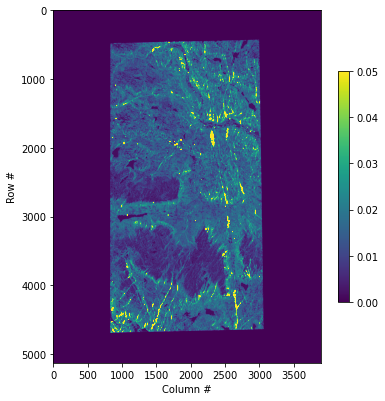

In [29]:
with rasterio.open('LRW_VH_Pre_strom_geo.tif') as stack:
    LRW = stack.read(1)
    
plt.figure(figsize=(6,8.5))
plt.imshow(LRW, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.xlabel('Column #')
plt.ylabel('Row #')

In [24]:
with rasterio.open('Pre_strom_geo.tif') as stack:
    # meta = stack.meta getting the metadata 
    VH_1 = stack.read(3)   # this is a numpy array
   
    
new_dataset = rasterio.open('stacked_3.tif', 'w', driver='GTiff',
    height = stack.height, width = stack.width,
    count=1, dtype=str(VH_1.dtype),
    crs=stack.crs,
    transform=stack.transform)

new_dataset.write(VH_1, 1)
new_dataset.close()

Text(0, 0.5, 'Row #')

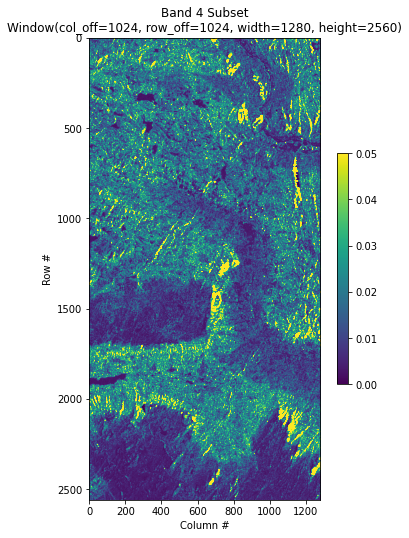

In [46]:
window = rasterio.windows.Window(1024, 1024, 1280, 2560)

with rasterio.open('Pre_strom_geo.tif') as stack:
    VH_1 = stack.read(1, window=window)
    # meta = stack.meta getting the metadata 

plt.figure(figsize=(6,8.5))
plt.imshow(VH_1, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')
    
#print(meta)

Text(0, 0.5, 'Row #')

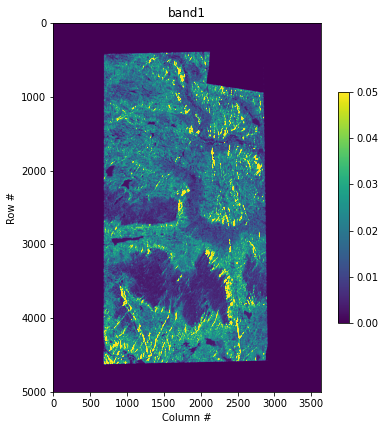

In [45]:
with rasterio.open('Pre_strom_geo.tif') as stack:
    VH_1 = stack.read(1)
    # meta = stack.meta getting the metadata 

plt.figure(figsize=(6,8.5))
plt.imshow(VH_1, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title('band1')
plt.xlabel('Column #')
plt.ylabel('Row #')
    
#print(meta)

In [76]:
# getting the simulated intensity
sim = []
sim_n = []
itr = 0
for band in dft_band:
    if band.startswith('simulatedImage'):
        sim.append(itr)
    else:
        sim_n.append(itr)
    itr = itr + 1
            
# getting the spesific band for VH
pol ='VH'
pol_b = []
pol_bn = []
itr = 0
for band in dft_band:
    if 'Gamma0' in band and pol in band:
        pol_b.append(itr)
    else:
        pol_bn.append(itr)
    itr = itr + 1

In [111]:
with rasterio.open('Pre_strom_geo.tif') as stack:
    all_band = stack.read()
    
band_VH = np.delete(all_band, pol_bn, axis=0)
band_sim = np.delete(all_band, sim_n, axis=0)

print(band_VH.shape)

(3, 5004, 3636)


Text(0, 0.5, 'Row #')

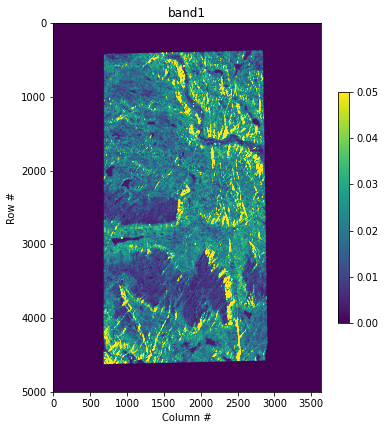

In [86]:
VH_1 = band_VH[1]
    # meta = stack.meta getting the metadata 

plt.figure(figsize=(6,8.5))
plt.imshow(VH_1, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title('band1')
plt.xlabel('Column #')
plt.ylabel('Row #')

In [141]:
# create the total simulation

# band_sim[band_sim == 0] = 'nan' # replace zero with nan to avoid infinity 
LA = np.zeros((band_VH.shape[1], band_VH.shape[2]))

for i in list(range(0, band_VH.shape[0])):
    temp = 1/band_sim[i]
    temp = np.nan_to_num(temp, posinf=0.0)
    LA = LA + temp

C:\ProgramData\Anaconda3\envs\python36\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys


Text(0, 0.5, 'Row #')

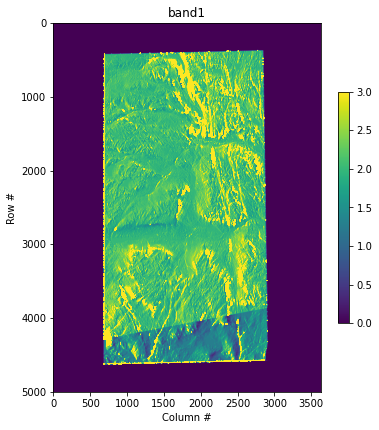

In [142]:
plt.figure(figsize=(6,8.5))
plt.imshow(LA, vmin=0, vmax=3)
plt.colorbar(shrink=0.5)
plt.title('band1')
plt.xlabel('Column #')
plt.ylabel('Row #')

In [147]:
# calculate the LRW

LRW = np.zeros((band_VH.shape[1], band_VH.shape[2]))

for i in list(range(0, band_VH.shape[0])):
    temp = 1/band_sim[i]
    temp = np.nan_to_num(temp, posinf=0.0)
    temp = band_VH[i] * temp / LA
    temp = np.nan_to_num(temp, posinf=0.0)
    LRW = LRW + temp

C:\ProgramData\Anaconda3\envs\python36\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
C:\ProgramData\Anaconda3\envs\python36\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


Text(0, 0.5, 'Row #')

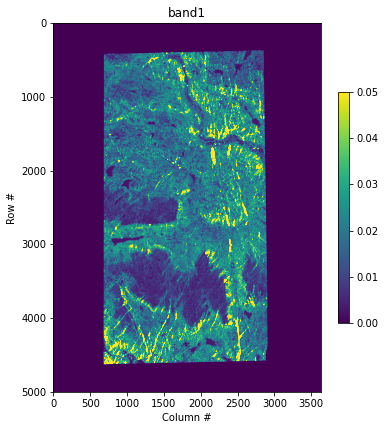

In [148]:
plt.figure(figsize=(6,8.5))
plt.imshow(LRW, vmin=0, vmax=0.05)
plt.colorbar(shrink=0.5)
plt.title('band1')
plt.xlabel('Column #')
plt.ylabel('Row #')

In [149]:
# write into geotiff 

with rasterio.open('Pre_strom_geo.tif') as stack:
    temp = stack.read(1)

new_dataset = rasterio.open('LRW_numpy.tif', 'w', driver='GTiff',
    height = stack.height, width = stack.width,
    count=1, dtype=str(LRW.dtype),
    crs=stack.crs,
    transform=stack.transform)

new_dataset.write(LRW, 1)
new_dataset.close()